In [1]:
import os
import cv2
import time
import clip
import numpy as np
from mmdet.apis import inference_detector, init_detector
from mmdet.registry import VISUALIZERS
from mmcv.transforms import Compose
from mmdet.visualization import DetLocalVisualizer
from PIL import Image
from utils.videoutils import (
    Player,
    MaskedVideoCapture,
    VibrationCalibrator,
)
from ClipAdapter.adapter import ClipAdapter
from utils.clip_utils import (
    batch_crop,
    batch_preprocess,
    assign_clip_label,
    generate_colors
)
from utils.SurRecord import *
if __name__ == "__main__":
    videoId="D06_20210318141616"
    videoPath = f"/CV/WD16T/2021.02-2021.04/D06/{videoId}.mp4"  # 视频路径
    mtx, dist = np.load(
        "/home/gaobiaoli/dataset/undistort/D03.npy", allow_pickle=True
    )  # 畸变参数
    baseImg = cv2.imread(
        f"/CV/3T/dataset-public/videoBaseImg/D06/baseImg/{videoId}.png"
    )  # videobase
    baseH = np.load(
        f"/home/gaobiaoli/dataset/D06/baseH/{videoId}.npy"
    )  # Htobase
    BimH = np.load("/home/gaobiaoli/dataset/base/8F_D06.npy")  # HtoBim
    bimFloor = cv2.imread("/home/gaobiaoli/dataset/base/target8F_L.png")  # Bim图
    trans_bim = cv2.warpPerspective(
        bimFloor, np.linalg.inv(BimH), baseImg.shape[:2][::-1], borderValue=0
    )
    trans_bim = cv2.cvtColor(trans_bim, cv2.COLOR_BGR2GRAY)
    cropSavePath="/CV/3T/dataset-public/videoBaseImg/D06/cropImg"
    
    

    calibrator = VibrationCalibrator(baseImg=baseImg, baseHomography=baseH)
    cap = MaskedVideoCapture(
        videoPath=videoPath, initStep=0,interval=500, mtx=mtx, dist=dist, calibrator=calibrator
    )

    

    


In [3]:
t1=time.time()
ret, frame = cap.read()
if ret:
    frame[trans_bim!=197]=0
    player.show(frame)
    print("Frame:{}---FPS:{}".format(cap.count(),1/(time.time()-t1)))
    

Frame:500---FPS:0.17256867171662937


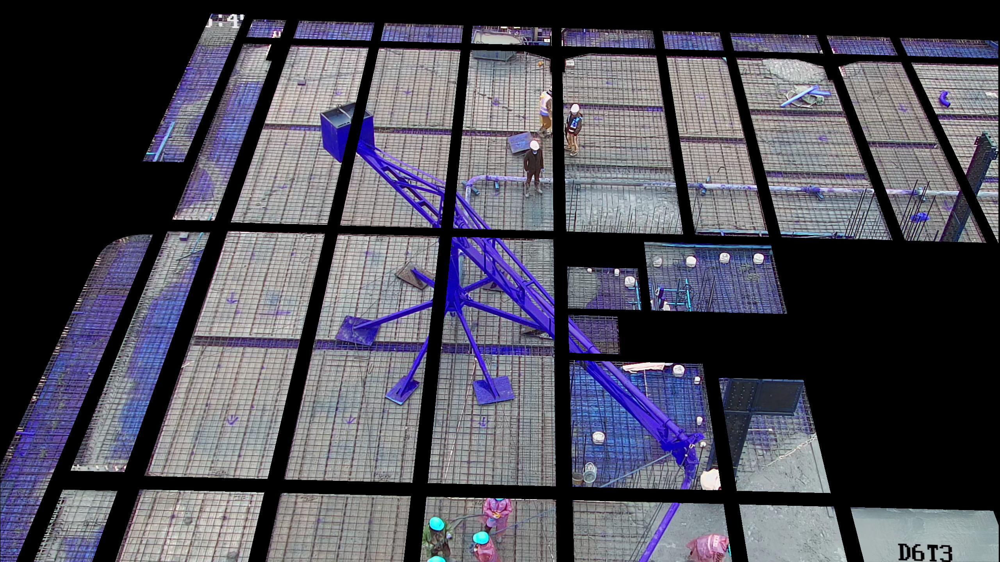

In [2]:
videoId="D06_20210318141616"
videoId="D06_20210319140542"
videoPath = f"/CV/WD16T/2021.02-2021.04/D06/{videoId}.mp4"  # 视频路径
mtx, dist = np.load(
    "/home/gaobiaoli/dataset/undistort/D03.npy", allow_pickle=True
)  # 畸变参数
baseImg = cv2.imread(
    f"/CV/3T/dataset-public/videoBaseImg/D06/baseImg/{videoId}.png"
)  # videobase
baseH = np.load(
    f"/home/gaobiaoli/dataset/D06/baseH/{videoId}.npy"
)  # Htobase
BimH = np.load("/home/gaobiaoli/dataset/base/8F_D06.npy")  # HtoBim
bimFloor = cv2.imread("/home/gaobiaoli/dataset/base/target8F_L.png")  # Bim图
trans_bim = cv2.warpPerspective(
    bimFloor, np.linalg.inv(BimH), baseImg.shape[:2][::-1], borderValue=0
)
calibrator = VibrationCalibrator(baseImg=baseImg, baseHomography=baseH)
cap = MaskedVideoCapture(
    videoPath=videoPath, initStep=0,interval=100, mtx=mtx, dist=dist, calibrator=calibrator
)
t1=time.time()
ret, frame = cap.read()
frame = cv2.warpPerspective(
            frame, baseH, frame.shape[:2][::-1], borderValue=0
        )
frame[trans_bim!=197]=0
Image.fromarray(frame)

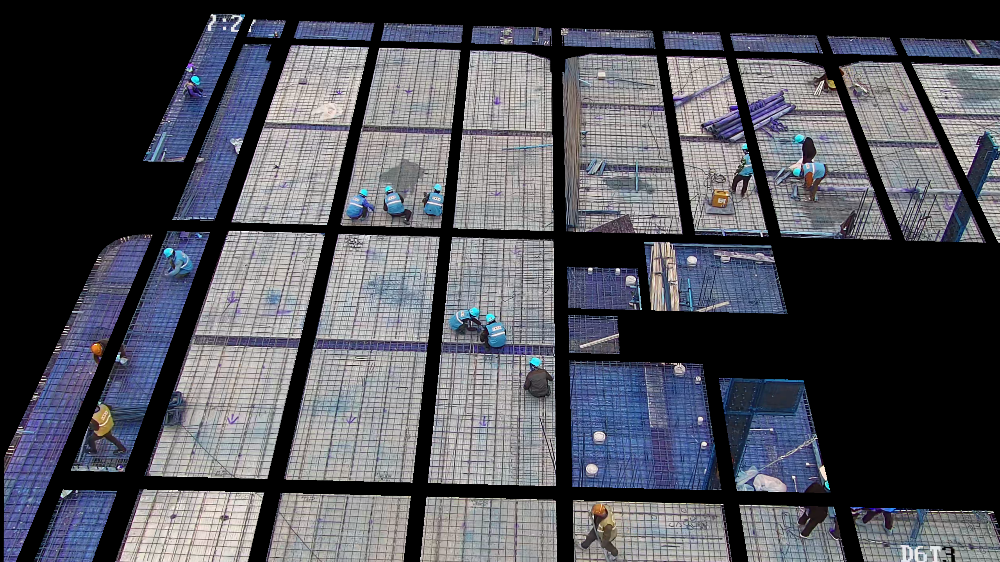

In [5]:
from PIL import Image
videoId="D06_20210318141616"
baseImg = cv2.imread(
    f"/CV/3T/dataset-public/videoBaseImg/D06/baseImg/{videoId}.png"
)  # videobase
baseH = np.load(
    f"/home/gaobiaoli/dataset/D06/baseH/{videoId}.npy"
)  # Htobase
frame = cv2.warpPerspective(
            baseImg, baseH, baseImg.shape[:2][::-1], borderValue=0
        )
frame[trans_bim!=197]=0
Image.fromarray(frame)